<a href="https://colab.research.google.com/github/justyntyrrell/Anomoly_Detection/blob/main/predict_energy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Definition

**Intro**
 
As stated, the aim of this project is to build a model that predicts electricity consumption, the "KWH" column in the data set. This stands for Kilowatt Hour which is the electrical energy used by a home in the year 2009. 
 
There are a few considerations that need to be made when designing the model. For example, what data is going to be available when the model is to be used? Is the prediction at the beginning of the year or the end? I'm going to assume the prediction will be made at the beginning of the year because presumably energy consumption data would be available after the year is done. 
 
Another consideration is who will be using the model and how easy will it be to have the data inputs available. If the user is a homeowner inputting fields it would be simpler if there were only 25-30 data fields to input to make the prediction. 
 
 
My goal metric of success for this model will be low error first, and then some consideration in feature reduction. Some other model performance metrics are inference time, model size, training time. I won't be considering these metrics.
 
 
First I'll start with some exploratory data analysis

# Exploratory Data Analysis

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
%matplotlib inline

import warnings
warnings.filterwarnings(action="ignore")

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from sklearn.model_selection import train_test_split
import sklearn

In [ ]:
# Residential Energy Consumption (REC) Survey Dataset
rec_file_path = '/content/drive/MyDrive/Data Science/zesty/recs2009_public.csv'

# Variable desriptions and possible responses
variable_file_path = '/content/drive/MyDrive/Data Science/zesty/public_layout.csv'

In [ ]:
rec_df = pd.read_csv(rec_file_path, index_col = 'DOEID')
variable_codebook_df = pd.read_csv(variable_file_path, index_col= 'Variable Name')

In [ ]:
rec_df

,REGIONC,DIVISION,REPORTABLE_DOMAIN,TYPEHUQ,NWEIGHT,HDD65,CDD65,HDD30YR,CDD30YR,Climate_Region_Pub,...,SCALEKER,IECC_Climate_Pub,HDD50,CDD80,GND_HDD65,WSF,OA_LAT,GWT,DesignDBT99,DesignDBT1
DOEID,,,,,,,,,,,,,,,,,,,,,
1,2,4,12,2,2471.68,4742,1080,4953,1271,4,...,-2,4A,2117,56,4250,0.48,6,56,9,96
2,4,10,26,2,8599.17,2662,199,2688,143,5,...,-2,3C,62,26,2393,0.61,0,64,38,73
3,1,1,1,5,8969.92,6233,505,5741,829,1,...,-2,5A,2346,49,5654,0.48,3,52,12,88
4,2,3,7,2,18003.64,6034,672,5781,868,1,...,-2,5A,2746,0,4941,0.55,4,55,7,87
5,1,1,1,3,5999.61,5388,702,5313,797,1,...,-2,5A,2251,0,5426,0.61,4,50,13,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12079,2,3,9,2,10219.80,7671,332,7784,451,1,...,-2,6A-6B,4289,39,7819,0.59,0,48,-3,84
12080,3,7,21,4,8689.07,2085,2844,2520,2286,2,...,-2,3B-4B,360,393,1869,0.50,0,56,26,101
12081,2,4,10,2,4697.21,7935,472,8074,600,1,...,-2,6A-6B,4494,22,8477,0.58,1,46,-9,89


In [ ]:
variable_codebook_df

,Variable Label,Variable Order in File,Variable Type,Length
Variable Name,,,,
DOEID,Unique identifier for each respondent,1,Character,5
REGIONC,Census Region,2,Numeric,8
DIVISION,Census Division,3,Numeric,8
REPORTABLE_DOMAIN,Reportable states and groups of states,4,Numeric,8
TYPEHUQ,Type of housing unit,5,Numeric,8
...,...,...,...,...
WSF,Weather & shielding factor for the housing unit,936,Numeric,8
OA_LAT,Annual value for latent heat infiltration from...,937,Numeric,8
GWT,Annual average ground water temperature (F) fo...,938,Numeric,8



Looking at the variable codebook it is seen that the vast majority of categorical features have already been label encoded. I will use these values as is. You could try other encoding methods like one hot encoding but given the large number of features and categories this would drastically increase the number of columns. Maybe after some feature selection it could be worth investigating.


In [ ]:
rec_df.describe()

,REGIONC,DIVISION,REPORTABLE_DOMAIN,TYPEHUQ,NWEIGHT,HDD65,CDD65,HDD30YR,CDD30YR,Climate_Region_Pub,...,PERIODKR,SCALEKER,HDD50,CDD80,GND_HDD65,WSF,OA_LAT,GWT,DesignDBT99,DesignDBT1
count,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,...,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000,12083.000000
mean,2.628321,5.373086,14.783663,2.659604,9402.981870,4141.375238,1415.406108,4135.146983,1443.503104,2.601010,...,-1.935943,-1.955392,1681.961764,139.568485,3763.728544,0.499036,5.656046,59.128693,20.256311,90.359431
std,1.042142,2.859366,8.195824,1.192627,5192.101419,2317.759375,1134.659475,2260.543686,1021.748722,1.349571,...,0.589907,0.415810,1401.079218,264.186908,2597.754419,0.083520,6.797205,8.678293,15.337626,6.166669
min,1.000000,1.000000,1.000000,1.000000,476.100000,0.000000,0.000000,0.000000,0.000000,1.000000,...,-2.000000,-2.000000,0.000000,0.000000,0.000000,0.310000,0.000000,36.000000,-23.000000,60.000000
25%,2.000000,3.000000,8.000000,2.000000,6297.040000,2197.500000,561.000000,2224.000000,712.000000,1.000000,...,-2.000000,-2.000000,262.500000,4.000000,1246.500000,0.430000,1.000000,52.000000,9.000000,87.000000
50%,3.000000,5.000000,15.000000,2.000000,7970.630000,4483.000000,1045.000000,4502.000000,1179.000000,3.000000,...,-2.000000,-2.000000,1684.000000,30.000000,3878.000000,0.500000,3.000000,58.000000,18.000000,90.000000
75%,3.000000,7.000000,21.000000,3.000000,11330.030000,5913.000000,1897.000000,5854.000000,1842.500000,4.000000,...,-2.000000,-2.000000,2662.000000,117.000000,5834.000000,0.560000,7.000000,66.000000,33.000000,94.000000
max,4.000000,10.000000,27.000000,5.000000,95779.140000,12525.000000,5480.000000,13346.000000,5357.000000,5.000000,...,5.000000,3.000000,7623.000000,1884.000000,11567.000000,0.800000,34.000000,89.000000,67.000000,118.000000


In [ ]:
# Check how much data is missing from each column
total = rec_df.isnull().sum().sort_values(ascending=False)
percent = (rec_df.isnull().sum()/rec_df.isnull().count()).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis = 1, keys = ['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
REGIONC,0,0.0
ZPOOL,0,0.0
DRAFTY,0,0.0
INSTLWS,0,0.0
AGEWS,0,0.0
HELPWS,0,0.0
HELPWSY,0,0.0
AUDIT,0,0.0
AGEAUD,0,0.0
HELPAUD,0,0.0


**Missing Data**

It first appears that there is no missing data but after reading the technical documentation it states that a hot-deck imputation method was used on missing values. So a value from a similar house was put in place of the missing value. In addition there is an imputation flag for each feature with the naming convention `ZFEATURENAME`. It has a `1` if it's an imputed value, `0` if it a real survey response. This means about half of the 934 columns are real features and the Z flags can be discarded for modeling. Using the flag column you could try multiple methods of imputation but I'll use the data set as is.

In [ ]:
#check distrubution of the data 
print('Skewness: %f' % rec_df['KWH'].skew())
print('Kurtosis: %f' % rec_df['KWH'].kurtosis())

Skewness: 2.114188
Kurtosis: 13.917123


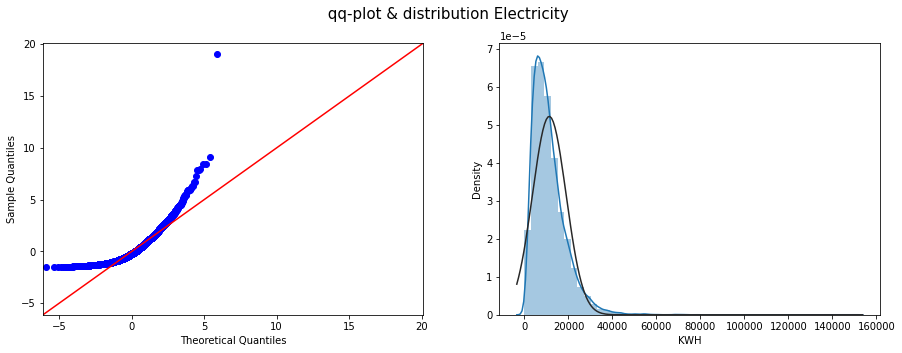

In [ ]:
# Histogram of the 

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution Electricity ", fontsize= 15)

sm.qqplot(rec_df['KWH'], stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(rec_df['KWH'], kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

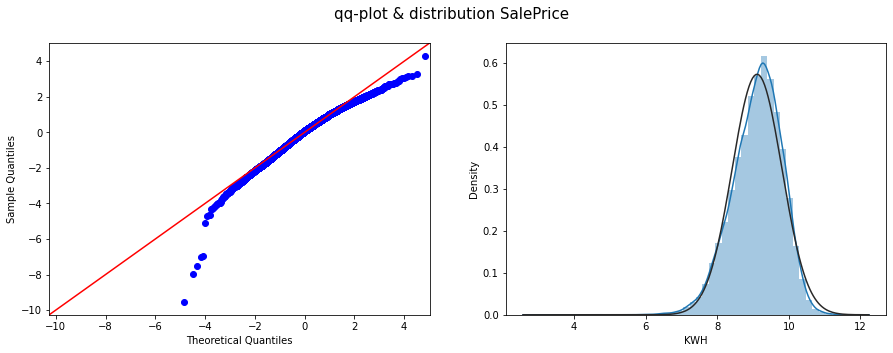

In [ ]:
# Electricity after transformation

target_log = np.log1p(rec_df['KWH'])

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

In [ ]:
#check distrubution of the data 
print('Skewness: %f' % target_log.skew())
print('Kurtosis: %f' % target_log.kurtosis())

Skewness: -0.561740
Kurtosis: 1.402092


After the transformation the target variable is improved but still skewed its skewness is outside of the range -0.5:0.5. 
 
I'm not going to transform the feature variables or target variables. Normalizing them can improve the performance of linear models.


Next I'll check the correlation of the features against the target Variable `KWH`. With such a large amount of features (939 columns) it would be easy to have some data leakage. These are features that provide information that wouldn't be available when making the prediction.

I've also joined it with the variable description data set to make it easier to understand what the variable represents.

In [ ]:
rec_corr = rec_df.corr()
rec_corr = rec_corr.join(variable_codebook_df)
rec_corr['KWH'] = rec_corr['KWH'].abs()
rec_corr[['KWH', 'Variable Label']].sort_values(by = 'KWH', ascending =False).head(60)


,KWH,Variable Label
KWH,1.000000,"Total Site Electricity usage, in kilowatt-hour..."
BTUEL,1.000000,"Total Site Electricity usage, in thousand BTU,..."
BTUELOTH,0.880403,Electricity usage for other purposes (all end-...
KWHOTH,0.880403,Electricity usage for other purposes (all end-...
DOLLAREL,0.868712,"Total Electricity cost, in whole dollars, 2009"
DOLELOTH,0.702251,Electricity cost for other purposes (all end-u...
TOTALBTUOTH,0.676108,"Total usage for appliances, electronics, light..."
TOTALDOLOTH,0.655742,"Total cost for appliances, electronics, lighti..."
BTUELCOL,0.655104,"Electricity usage for air-conditioning, centra..."
KWHCOL,0.655104,"Electricity usage for air-conditioning, centra..."


Right away we see the feature `BTUEL` is perfectly correlated with KWH with a coefficient of 1.0. This makes sense because from the variable description we can see it is also energy consumption but in a different unit, a thousand British thermal units (BTU). 
 
There are similar situations like `DOLLAREL` which is total electricity cost, in whole dollars, 2009. 
 
After skimming the data set it seems that the problematic variables occur after `KWH` so I will remove these features.
 
I'll keep in features such as `USECENAC` (Frequency central air conditioner used in summer 2009) because while that info wouldn't be available until after the year was done, estimating it with how many times you expect to do something is valid.

In [ ]:
# select column names before KWH
features_before_kwh = rec_df.columns.to_list()[:839]
rec_cleaned = rec_df.iloc[:, :839]

# Remove imputation flag columns, they can be identified as staring column names starting with Z

clean_feature_list = []
for i in features_before_kwh:
  if i[0] != 'Z':
    clean_feature_list.append(i)

In [ ]:
# Correlation matrix with cleaned features, also merged with variable dataframe

rec_corr = rec_df[clean_feature_list].corr()
rec_corr = rec_corr.join(variable_codebook_df)
rec_corr_abs = rec_corr
rec_corr_abs['KWH'] = rec_corr_abs['KWH'].abs()
top_60 = rec_corr_abs[['KWH', 'Variable Label']].sort_values(by = 'KWH', ascending =False).head(60)
top_60

,KWH,Variable Label
KWH,1.000000,"Total Site Electricity usage, in kilowatt-hour..."
TOTCSQFT,0.484042,Total cooled square footage
TOTROOMS,0.439167,Total number of rooms in the housing unit
ACROOMS,0.435835,Number of rooms cooled
NCOMBATH,0.420556,Number of full bathrooms
TOTHSQFT,0.410385,Total heated square footage
BEDROOMS,0.403322,Number of bedrooms
HEATROOM,0.390796,Number of rooms heated
TOTSQFT,0.385918,Total square footage (includes all attached ga...
NUMCFAN,0.383531,Number of ceiling fans used


After removing the data leakage type variables we get a more interesting list of features correlated to `KWH`. Note, it's the absolute value of the correlation coefficient so it could be a positive or negative correlation. 
 
There are a lot of features related to heating, cooling, and the area/size of the residence. We can also gather that there are a lot of related features which could mean collinear features which can be problematic for some models. 
 

In [ ]:
top_60_feature_list = top_60.index.tolist()

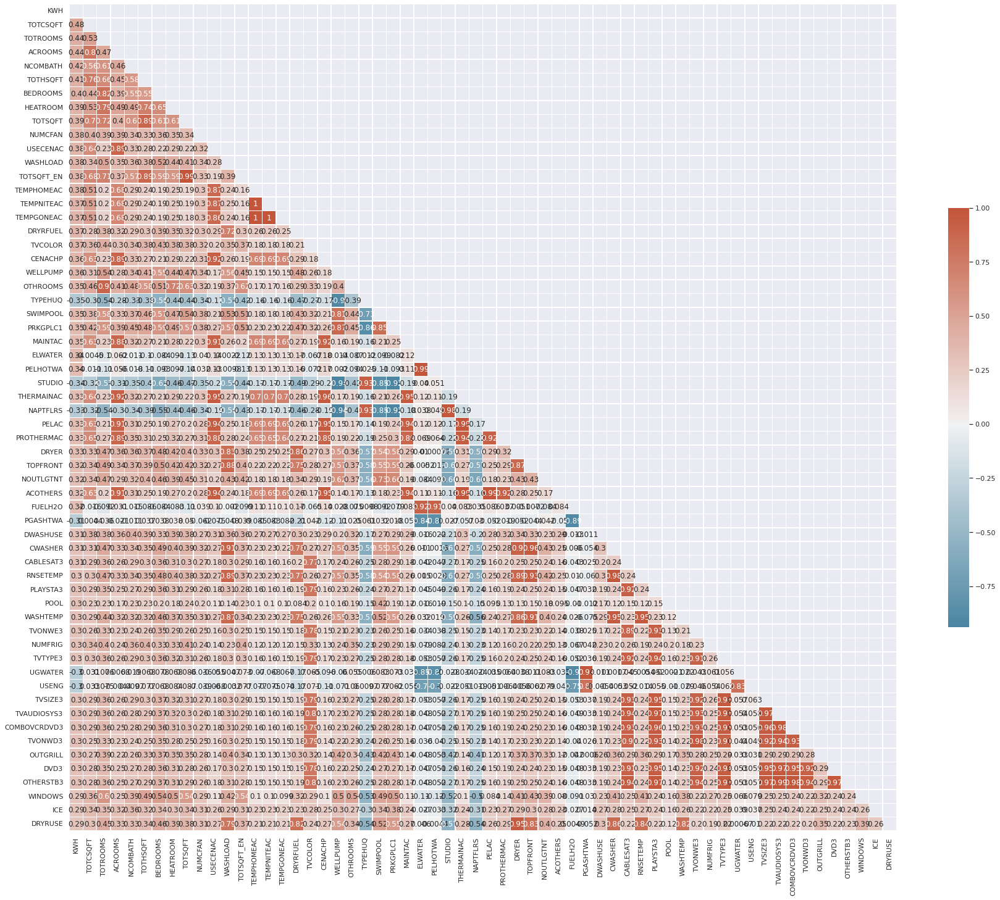

In [ ]:
# Correlation Matrix

corr_mat_top_60 = rec_df[top_60_feature_list].corr()


f, ax = plt.subplots(figsize=(30, 25))
mask = np.triu(np.ones_like(corr_mat_top_60, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_mat_top_60, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

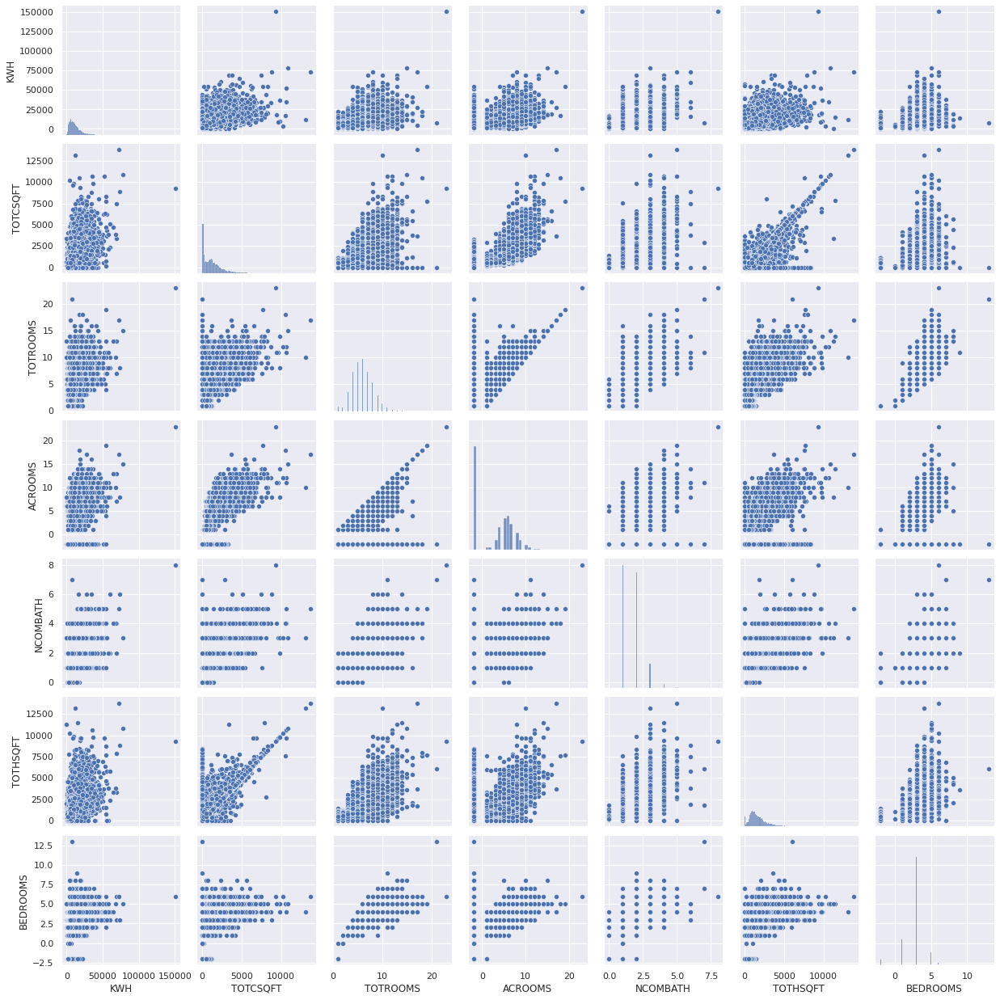

In [ ]:
sns.set()

sns.pairplot(rec_df[top_60.index.tolist()[:7]], height = 2.5)
plt.show();

# Modeling

In [ ]:
pip install eli5

In [ ]:
pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 4.4 MB/s 


In [ ]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 1.3 MB/s 


In [ ]:
from xgboost import XGBRegressor

In [ ]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

In [ ]:
# Remove the target Varble KWH from the list of features I'm going to use
clean_feature_list.remove('KWH')

# create X and Y dataframes

y = rec_df['KWH']
X = rec_df[clean_feature_list]

In [ ]:
# split dataset into 90% of the values for training and 10% test set

test_size=0.10
train_X, test_X, train_y, test_y = train_test_split(X, y, random_state = 0)

In [ ]:
# Get list of categorical variables
s = (train_X.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables:")
print(object_cols)

Categorical variables:
['METROMICRO', 'UR', 'NOCRCASH', 'NKRGALNC']


For the sake of time and simplicity I will drop the categorical features as there are only four

In [ ]:
train_X_numerical = train_X.drop(columns = object_cols)

In [ ]:
test_X_numerical = test_X.drop(columns = object_cols)

We'll be using root mean squared error to measure model prediction performance. This is a common metric to use. 

In [ ]:
# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train_X_numerical, train_y, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [ ]:
target_log = np.log1p(train_y)

I chose a variety of model types including linear, support vector machine, and desion tree based. I chose not to include any neural network models as these usually require a large amount of data to perform well. They are also sometimes harder to interpret.

In [ ]:
# 10 Fold Cross validation


kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())


final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

Streaming output truncated to the last 5000 lines.
4:	learn: 6951.5468196	total: 138ms	remaining: 27.4s
5:	learn: 6819.1842799	total: 162ms	remaining: 26.9s
6:	learn: 6700.7152766	total: 185ms	remaining: 26.3s
7:	learn: 6581.9905215	total: 221ms	remaining: 27.4s
8:	learn: 6469.8803498	total: 246ms	remaining: 27.1s
9:	learn: 6370.3271817	total: 271ms	remaining: 26.8s
10:	learn: 6273.3090597	total: 296ms	remaining: 26.6s
11:	learn: 6188.6982764	total: 320ms	remaining: 26.4s
12:	learn: 6114.6350154	total: 342ms	remaining: 26s
13:	learn: 6030.7988805	total: 366ms	remaining: 25.8s
14:	learn: 5957.2411695	total: 389ms	remaining: 25.6s
15:	learn: 5887.4446971	total: 412ms	remaining: 25.3s
16:	learn: 5817.0712371	total: 446ms	remaining: 25.8s
17:	learn: 5756.6658024	total: 469ms	remaining: 25.6s
18:	learn: 5696.0183320	total: 492ms	remaining: 25.4s
19:	learn: 5642.8277510	total: 515ms	remaining: 25.2s
20:	learn: 5597.4854194	total: 537ms	remaining: 25.1s
21:	learn: 5551.2815043	total: 561ms	re

In [ ]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,4729.742778,345.674564
1,LGBM_Reg.,4515.519019,404.022399
2,SVR,7839.113968,476.298132
3,Dec_Tree_Reg.,6983.929922,640.613787
4,Random_Forest_Reg.,4831.896237,423.072029
5,XGB_Reg.,4660.605262,359.709397
6,Grad_Boost_Reg.,4660.335283,321.348711
7,Cat_Boost_Reg.,4435.552348,397.921045


Based on these results the cat boosted model performed the best, so I am going to move forward with this model. The LGBM model also performed well and could be a good option, particularly because it can have advantages of faster training speed and higher efficiency if that is a design goal.


Next I'm going to train a catboost model so we can get an idea of which features are most impactful to the model

In [ ]:
X_train,X_val,y_train,y_val = train_test_split(train_X_numerical,train_y,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0
                    )

catf_pred = cat_model.predict(X_val)
catf_score = rmse(y_val, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

4353.3657556271655

In [ ]:
feat_imp = cat.get_feature_importance(prettified=True)
feat_imp_varible_desc = feat_imp.join(variable_codebook_df, on = 'Feature Id')

feat_imp_varible_desc.head(20)

,Feature Id,Importances,Variable Label,Variable Order in File,Variable Type,Length
0,FUELHEAT,6.809598,Main space heating fuel,431,Numeric,8
1,TOTCSQFT,4.584390,Total cooled square footage,832,Numeric,8
2,PELHOTWA,4.293169,Who pays for electricity used for water heating,701,Numeric,8
3,SWIMPOOL,3.066139,Swimming pool,591,Numeric,8
4,FUELH2O,2.891223,Fuel used by main water heater,507,Numeric,8
5,ELWATER,2.497408,Electricity used for water heating,665,Numeric,3
6,TOTROOMS,2.086144,Total number of rooms in the housing unit,35,Numeric,8
7,ACROOMS,2.019982,Number of rooms cooled,542,Numeric,8
8,TYPEHUQ,1.914556,Type of housing unit,5,Numeric,8
9,DRYRFUEL,1.799724,Fuel used by clothes dryer,237,Numeric,8


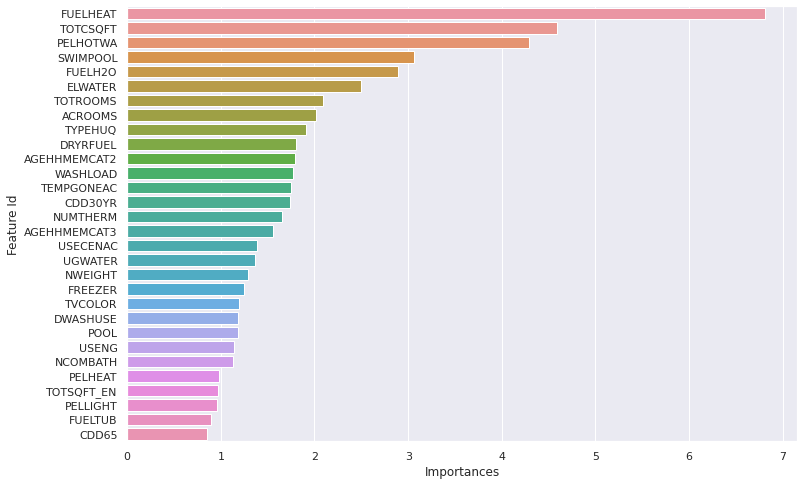

In [ ]:
# Feature Importance as a Bar Chart

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:30],feat_imp['Feature Id'][:30], orient = 'h')
plt.show()

In [ ]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

The goal of SHAP is to explain the prediction of an instance x by computing the contribution of each feature to the prediction. 

SHAP clustering works by clustering the Shapley values of each instance. This means that you cluster instances by explanation similarity. Each position on the x-axis is an instance of the data. Red SHAP values increase the prediction, blue values decrease it.




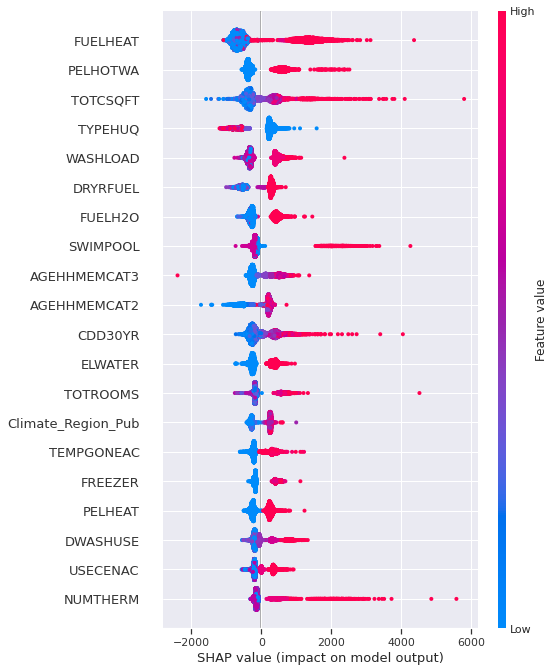

In [ ]:
shap.summary_plot(shap_values, X_train)

The summary plot combines feature importance with feature effects. Each point on the summary plot is a Shapley value for a feature and an instance. The position on the y-axis is determined by the feature and on the x-axis by the Shapley value. The color represents the value of the feature from low to high. Overlapping points are jittered in y-axis direction, so we get a sense of the distribution of the Shapley values per feature. The features are ordered according to their importance.

Model interpretability can be useful for a few reasons. It can inform feature engineering, direct future data collection, inform human decision-making, and build trust that the model is working correctly. 
Potential feature engineering could be using geospatial data, latitude and longitude instead of state categories. This way the model will know where states are in relation to each other. Weather relates to geographic location and we’ve seen that heating and cooling the residence to be a large factor in energy consumption.


`AGEHHMEMCAT2` is the age of the second household member. There are also age features for each additional household member. My first thought was to add number of household members as an additional feature. However, after checking I found this is already a feature included.


Next I'll see if the number of features can be reduced and how this impacts model prediction performance.

In [ ]:
# Selecting the Best important features using SelectFromModel

cat_selector = SelectFromModel(estimator=CatBoostRegressor())

cat_selector.fit(train_X_numerical, train_y)
train_X_numerical.columns[cat_selector.get_support()]

Learning rate set to 0.057999
0:	learn: 7553.0541930	total: 27.1ms	remaining: 27.1s
1:	learn: 7383.8183361	total: 53.7ms	remaining: 26.8s
2:	learn: 7220.7009215	total: 81.4ms	remaining: 27.1s
3:	learn: 7070.6318280	total: 108ms	remaining: 26.8s
4:	learn: 6924.9266903	total: 133ms	remaining: 26.6s
5:	learn: 6799.5099398	total: 162ms	remaining: 26.9s
6:	learn: 6671.3783432	total: 189ms	remaining: 26.8s
7:	learn: 6552.9621055	total: 220ms	remaining: 27.3s
8:	learn: 6445.1059700	total: 245ms	remaining: 27s
9:	learn: 6344.2186321	total: 270ms	remaining: 26.8s
10:	learn: 6249.4394690	total: 296ms	remaining: 26.6s
11:	learn: 6158.2642908	total: 322ms	remaining: 26.5s
12:	learn: 6074.7567235	total: 353ms	remaining: 26.8s
13:	learn: 5993.0741731	total: 383ms	remaining: 27s
14:	learn: 5921.3543910	total: 409ms	remaining: 26.9s
15:	learn: 5850.9401581	total: 439ms	remaining: 27s
16:	learn: 5787.4342364	total: 465ms	remaining: 26.9s
17:	learn: 5717.9805923	total: 492ms	remaining: 26.8s
18:	learn: 

Index(['REGIONC', 'DIVISION', 'REPORTABLE_DOMAIN', 'TYPEHUQ', 'NWEIGHT',
       'HDD65', 'CDD65', 'HDD30YR', 'CDD30YR', 'Climate_Region_Pub',
       'AIA_Zone', 'YEARMADE', 'OCCUPYYRANGE', 'WALLTYPE', 'NAPTFLRS',
       'BEDROOMS', 'NCOMBATH', 'TOTROOMS', 'PRKGPLC2', 'OVEN', 'OVENUSE',
       'OUTGRILLFUEL', 'TOASTER', 'ICE', 'ESFRIG', 'TYPERFR2', 'SIZRFRI2',
       'REFRIGT2', 'SEPFREEZ', 'NUMFREEZ', 'UPRTFRZR', 'SIZFREEZ', 'AGEFRZR',
       'DWASHUSE', 'WASHLOAD', 'DRYRFUEL', 'TVCOLOR', 'TVSIZE1', 'TVTYPE1',
       'TVONWE2', 'COMBOVCRDVD3', 'DVD3', 'OTHERSTB3', 'MONITOR1', 'TIMEON2',
       'WELLPUMP', 'CHRGPLGE', 'EQUIPM', 'FUELHEAT', 'PERMELEC', 'HEATROOM',
       'NUMTHERM', 'TEMPGONE', 'TEMPNITE', 'FUELH2O', 'WHEATSIZ', 'ACROOMS',
       'USECENAC', 'TEMPHOMEAC', 'TEMPGONEAC', 'TEMPNITEAC', 'USEWWAC',
       'NUMCFAN', 'USECFAN', 'USENOTMOIST', 'SWIMPOOL', 'POOL', 'FUELPOOL',
       'RECBATH', 'FUELTUB', 'LGT12', 'LGT4', 'NOUTLGTNT', 'WINDOWS', 'DRAFTY',
       'USENG', 'ELWARM'

In [ ]:
top_features = train_X_numerical.columns[cat_selector.get_support()].to_list()

In [ ]:
len(train_X_numerical.columns)

475

In [ ]:
len(top_features)

97

In [ ]:
# Cat Boost Regressor

cat_model = cat.fit(X_train[top_features],y_train,
                     eval_set = (X_val[top_features],y_val),
                     plot=True,
                     verbose = 0)

catf_pred = cat_model.predict(X_val)
catf_score = rmse(y_val, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

4363.414876999275

So we were able to reduce the number of features from 475 to 97 with only a slightly worse RMSE. (4353 vs 4363) This appears like a comparable model in performance that could provide a good option if number of features is a criteria in model selection. You could also find which features to include without a drop in performance. 
 
Next we'll see how performance looks after reducing the model to 30 features.


In [ ]:
# Selecting the Best important features using SelectFromModel

cat_selector_30_features = SelectFromModel(estimator=CatBoostRegressor(), max_features = 30)

cat_selector_30_features.fit(train_X_numerical, train_y)
train_X_numerical.columns[cat_selector_30_features.get_support()]

Learning rate set to 0.057999
0:	learn: 7553.0541930	total: 66.1ms	remaining: 1m 6s
1:	learn: 7383.8183361	total: 134ms	remaining: 1m 6s
2:	learn: 7220.7009215	total: 198ms	remaining: 1m 5s
3:	learn: 7070.6318280	total: 253ms	remaining: 1m 3s
4:	learn: 6924.9266903	total: 318ms	remaining: 1m 3s
5:	learn: 6799.5099398	total: 398ms	remaining: 1m 5s
6:	learn: 6671.3783432	total: 457ms	remaining: 1m 4s
7:	learn: 6552.9621055	total: 500ms	remaining: 1m 2s
8:	learn: 6445.1059700	total: 535ms	remaining: 58.9s
9:	learn: 6344.2186321	total: 578ms	remaining: 57.3s
10:	learn: 6249.4394690	total: 637ms	remaining: 57.3s
11:	learn: 6158.2642908	total: 689ms	remaining: 56.8s
12:	learn: 6074.7567235	total: 738ms	remaining: 56s
13:	learn: 5993.0741731	total: 800ms	remaining: 56.3s
14:	learn: 5921.3543910	total: 865ms	remaining: 56.8s
15:	learn: 5850.9401581	total: 927ms	remaining: 57s
16:	learn: 5787.4342364	total: 1.04s	remaining: 59.9s
17:	learn: 5717.9805923	total: 1.16s	remaining: 1m 3s
18:	learn: 

Index(['TYPEHUQ', 'NWEIGHT', 'HDD65', 'CDD30YR', 'BEDROOMS', 'NCOMBATH',
       'TOTROOMS', 'DWASHUSE', 'WASHLOAD', 'DRYRFUEL', 'TVCOLOR', 'FUELHEAT',
       'NUMTHERM', 'FUELH2O', 'ACROOMS', 'USECENAC', 'TEMPHOMEAC',
       'TEMPGONEAC', 'SWIMPOOL', 'POOL', 'FUELPOOL', 'USENG', 'ELWATER',
       'PELHEAT', 'PELHOTWA', 'PELCOOK', 'PELLIGHT', 'AGEHHMEMCAT2',
       'AGEHHMEMCAT3', 'TOTCSQFT'],
      dtype='object')

In [ ]:
top_30_features = train_X_numerical.columns[cat_selector_30_features.get_support()].to_list()

In [ ]:
cat_model = cat.fit(X_train[top_30_features],y_train,
                     eval_set = (X_val[top_30_features],y_val),
                     plot=True,
                     verbose = 0)

catf_pred = cat_model.predict(X_val)
catf_score = rmse(y_val, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

4570.216677943539

With 30 features the performance is reduced more significantly.




Next we'll see if we can do some hyper parameter tuning to increase the performance of the model slightly. 

In [ ]:
# Catboost default paramters

cat_model.get_all_params()

{'auto_class_weights': 'None',
 'bayesian_matrix_reg': 0.10000000149011612,
 'best_model_min_trees': 1,
 'boost_from_average': True,
 'boosting_type': 'Plain',
 'bootstrap_type': 'MVS',
 'border_count': 254,
 'classes_count': 0,
 'depth': 6,
 'eval_metric': 'RMSE',
 'feature_border_type': 'GreedyLogSum',
 'force_unit_auto_pair_weights': False,
 'grow_policy': 'SymmetricTree',
 'iterations': 1000,
 'l2_leaf_reg': 3,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'leaf_estimation_iterations': 1,
 'leaf_estimation_method': 'Newton',
 'learning_rate': 0.07079300284385681,
 'loss_function': 'RMSE',
 'max_leaves': 64,
 'min_data_in_leaf': 1,
 'model_shrink_mode': 'Constant',
 'model_shrink_rate': 0,
 'model_size_reg': 0.5,
 'nan_mode': 'Min',
 'penalties_coefficient': 1,
 'pool_metainfo_options': {'tags': {}},
 'posterior_sampling': False,
 'random_seed': 0,
 'random_strength': 1,
 'rsm': 1,
 'sampling_frequency': 'PerTree',
 'score_function': 'Cosine',
 'sparse_features_conflict_fracti

In [ ]:
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [100,1500],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Streaming output truncated to the last 5000 lines.
1019:	learn: 3742.2702730	test: 6017.3949737	best: 6017.3949737 (1019)	total: 2m 42s	remaining: 1m 16s
1020:	learn: 3741.3545333	test: 6016.6836555	best: 6016.6836555 (1020)	total: 2m 42s	remaining: 1m 16s
1021:	learn: 3740.4861894	test: 6016.2088169	best: 6016.2088169 (1021)	total: 2m 42s	remaining: 1m 16s
1022:	learn: 3739.3779919	test: 6015.6211907	best: 6015.6211907 (1022)	total: 2m 42s	remaining: 1m 15s
1023:	learn: 3737.7425840	test: 6015.2022911	best: 6015.2022911 (1023)	total: 2m 42s	remaining: 1m 15s
1024:	learn: 3736.6478084	test: 6014.7377484	best: 6014.7377484 (1024)	total: 2m 43s	remaining: 1m 15s
1025:	learn: 3735.5577221	test: 6014.5762712	best: 6014.5762712 (1025)	total: 2m 43s	remaining: 1m 15s
1026:	learn: 3734.4434039	test: 6014.2389626	best: 6014.2389626 (1026)	total: 2m 43s	remaining: 1m 15s
1027:	learn: 3733.4909767	test: 6013.7482743	best: 6013.7482743 (1027)	total: 2m 43s	remaining: 1m 15s
1028:	learn: 3732.5841

In [ ]:
# Optimal parameters found by randomized grid search. 

randomized_search_result['params']

{'depth': 4, 'iterations': 1500, 'l2_leaf_reg': 9, 'learning_rate': 0.05}

In [ ]:
# Final Cat-Boost Regressor

params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 9,
          'eval_metric':'RMSE',
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [ ]:
catf_score

4430.13984077979

Interestingly this is a worse score than the default cat boost parameters. It may be that the parameter ranges need to be adjusted in the random grid search. For the sake of time we'll just go with the default parameters. 


We'll now train on the entire train set, including the validation sets. And test against the test set. 


In [ ]:
cat_model = cat.fit(train_X_numerical, train_y,
                     plot=True,
                     verbose = 0)

catf_pred = cat_model.predict(test_X_numerical)
catf_score = rmse(test_y, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

4083.6344033377336

In [ ]:
cat_model = cat.fit(train_X_numerical[top_features], train_y,
                    plot=True,
                    verbose = 0)

catf_pred = cat_model.predict(test_X_numerical[top_features])
catf_score = rmse(test_y, catf_pred)
catf_score

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

4138.808472418975

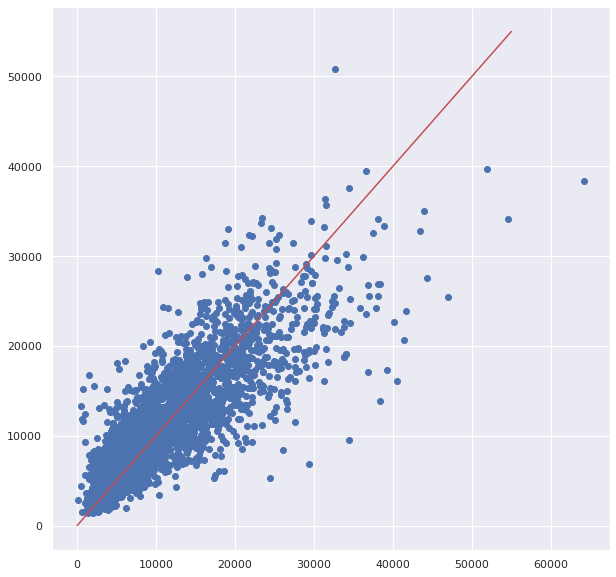

In [ ]:
plt.figure(figsize=(10, 10))
fig = plt.scatter(test_y, catf_pred)

x_value = np.linspace(0,55000 ,55000)
y_value = x
plt.plot(x, y_value, '-r', label='y= x')

This is a grapgh of the predicted KWH vs is the actual. There can be quite a difference between the two. 

The final step is to train the model on the complete dataset

In [ ]:
# Final Cat-Boost Regressor

cat_f = CatBoostRegressor()
cat_model_f = cat_f.fit(X.drop(columns = object_cols), y)


Learning rate set to 0.060696
0:	learn: 7449.6319769	total: 83.4ms	remaining: 1m 23s
1:	learn: 7277.1101272	total: 165ms	remaining: 1m 22s
2:	learn: 7121.9971490	total: 238ms	remaining: 1m 19s
3:	learn: 6964.3695829	total: 320ms	remaining: 1m 19s
4:	learn: 6831.1527414	total: 429ms	remaining: 1m 25s
5:	learn: 6696.8357538	total: 553ms	remaining: 1m 31s
6:	learn: 6566.7414526	total: 683ms	remaining: 1m 36s
7:	learn: 6453.5564503	total: 804ms	remaining: 1m 39s
8:	learn: 6340.6614502	total: 917ms	remaining: 1m 40s
9:	learn: 6235.5144923	total: 1.03s	remaining: 1m 41s
10:	learn: 6138.4978699	total: 1.16s	remaining: 1m 44s
11:	learn: 6047.7754111	total: 1.29s	remaining: 1m 46s
12:	learn: 5958.1064343	total: 1.44s	remaining: 1m 49s
13:	learn: 5878.2241766	total: 1.59s	remaining: 1m 51s
14:	learn: 5802.6565529	total: 1.71s	remaining: 1m 52s
15:	learn: 5736.3199617	total: 1.83s	remaining: 1m 52s
16:	learn: 5672.6036922	total: 1.93s	remaining: 1m 51s
17:	learn: 5614.4367959	total: 2.02s	remaini

In [ ]:
from joblib import dump, load
dump(cat_model_f, 'cat_model_final.joblib') 

['cat_model_final.joblib']

In [ ]:
y.describe()

count     12083.000000
mean      11288.159398
std        7641.190845
min          17.000000
25%        5837.000000
50%        9623.000000
75%       14765.000000
max      150254.000000
Name: KWH, dtype: float64

**Conclusion**
 
Is this model useful? The performance metric, RMSE, is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are. THe final model has an RMSE of 4083. We can compare this to the target variable y. `KWH` has an average value of 11288 kWh and std of 7641 kWh. This means the RMSE is a considerable portion of the typical energy consumption.
 
However, [this paper](https://innovationcenter.msu.edu/wp-content/uploads/2021/06/Effective-Features-to-Predict-Residential-Energy-Consumption-Using-Machine-Learning.pdf) acheived an RMSE of 4222.66 using 271 features and an SVM model. So the performance of our Catboost model seems comparable.
 
**Possible next steps**
 
 
There is a lot of opportunity to further investigate and improve this model. I think some feature engineering could be done to improve this model. I would also spend more time understanding the variables in the data set. It would also be interesting to plot learning curves and see if we would benefit from having more data. There are other RECS datasets available for different years. Combining these datasets would likely provide improved model prediction performance. 
 
Some more time could also be spent optimizing other aspects of the model other than prediction performance depending on its application. 
 
